In [2]:
using LinearAlgebra
using Plots
using Revise

using LatticeQM # my package

┌ Info: Precompiling LatticeQM [606d2a7e-9b17-11e9-1c5c-455b84f60309]
└ @ Base loading.jl:1260


### Example: Haldane ribbon (here armchair)

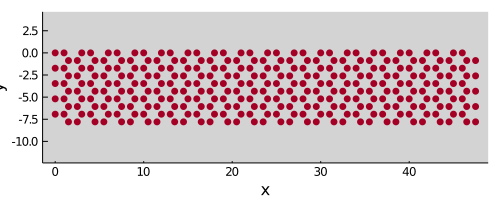

In [8]:
demolat = Structure.reduceto1D(Geometries2D.honeycomb(), [[1, 1] [5, -5]])
plot(demolat; supercell=[0:15], size=(500,200))

In [11]:
# Build (ribbon) geometry
N=30
lat1 = Structure.reduceto1D(Geometries2D.honeycomb(), [[1, 1] [N, -N]])
ks = kpath(lat1; num_points=500)

pos = Operators.positionalong(lat1, Structure.basis(lat1,2)) # position operator along the transverse of the ribbon

# Build the hopping Hamiltonian for the (semi-finite) lattice
hops1 = Operators.graphene(lat1; cellrange=3, mode=:nospin)
Operators.addhaldane!(hops1, lat1, 0.10)

# Calculate the bands and display them (together with expectation values of the position operator)
bands1 = getbands(hops1, ks, pos)
p1 = plot(bands1, 1; ylabel="\$\\varepsilon/t\$", colorbar_title="transverse position", markersize=1.25, size=(500,300), cquantile=1.0, colorbar=true, csymmetric=false)


Computing bands... 100%|████████████████████████████████| Time: 0:00:02


┌ Warning: Multiple series with different color share a colorbar. Colorbar may not reflect all series correctly.
└ @ Plots /Users/skilledwolf/.julia/packages/Plots/kgqnU/src/backends/gr.jl:506
